<span style="font-size:24px;">**Import Libraries**</span>

In [32]:
import numpy as np  # For numerical operations
import os  # For interacting with the operating system
import cv2  # For image processing
import math  # For mathematical operations
from pathlib import Path  # For working with file paths
import pandas as pd  # For data manipulation and analysis
import mediapipe as mp  # For facial landmark detection
import warnings  # For suppressing warnings
import scipy.io as sio  # For reading .mat files
import matplotlib.pyplot as plt  # For plotting graphs
from IPython.display import display, Image

# Sklearn imports
from sklearn.multioutput import MultiOutputRegressor  # For multi-output regression
from sklearn.svm import SVR  # Support Vector Regression
from sklearn.ensemble import RandomForestRegressor  # Random Forest Regression
from sklearn.tree import DecisionTreeRegressor  # Decision Tree Regression
from sklearn.ensemble import GradientBoostingRegressor  # Gradient Boosting Regression
from sklearn.ensemble import AdaBoostRegressor  # AdaBoost Regression
from sklearn.model_selection import train_test_split  # For splitting data into train and test sets
from sklearn.model_selection import GridSearchCV  # For hyperparameter tuning
from sklearn.metrics import mean_squared_error  # For calculating Mean Squared Error
from sklearn.metrics import mean_absolute_error  # For calculating Mean Absolute Error

# Ignore warnings
warnings.filterwarnings('ignore')


<span style="font-size:24px;">**Data Extraction and Processing**</span>

In [22]:
# Function to extract angles from .mat files
def extract_angles_from_mat(file_path):
    # Load the .mat file
    mat_data = sio.loadmat(file_path)
    
    # Extract the angles
    pose_para = mat_data["Pose_Para"][0][:3]
    pitch = pose_para[0]
    yaw = pose_para[1]
    roll = pose_para[2]
    
    return pitch, yaw, roll

# Initialize MediaPipe FaceMesh
face_mesh = mp.solutions.face_mesh.FaceMesh(static_image_mode=True, max_num_faces=1)

# Initialize an empty list to store landmark data
landmark_data = []

# Initialize an empty DataFrame to store the angles
angles_df = pd.DataFrame(columns=["File", "Pitch", "Yaw", "Roll"])

# Directory containing the image files and .mat files
image_dir = r"E:\iti ai intake 44 (2023-2024)\ml2\AFLW2000"

# Loop through each file in the directory
for filename in os.listdir(image_dir):
    # Check if the file is an image file
    if filename.endswith(".jpg"):
        # Construct the image path
        image_path = os.path.join(image_dir, filename)

        # Read the image
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Could not read image {image_path}")
            continue
    
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
        # Process the image to find facial landmarks
        result = face_mesh.process(image_rgb)
        
        # Check if facial landmarks are detected
        if result.multi_face_landmarks:
            landmark_points = []
            # Loop through each detected face
            for facial_landmarks in result.multi_face_landmarks:
                # Loop through each landmark point
                for landmark in facial_landmarks.landmark:
                    # Convert normalized coordinates to pixel coordinates
                    x = landmark.x * image.shape[1]
                    y = landmark.y * image.shape[0]
                    landmark_points.extend([x, y])
            
            # Append landmark data for the current image
            landmark_data.append([filename] + landmark_points)

            # Check if the corresponding .mat file exists
            mat_file_path = os.path.join(image_dir, filename.replace(".jpg", ".mat"))
            if os.path.exists(mat_file_path):
                # Extract angles from the .mat file
                try:
                    pitch, yaw, roll = extract_angles_from_mat(mat_file_path)
                except Exception as e:
                    print(f"Error extracting angles from file {filename}: {e}")
                    continue
                
                # Add the angles to the DataFrame
                angles_df = angles_df.append({"File": filename, "Pitch": pitch, "Yaw": yaw, "Roll": roll}, ignore_index=True)

# Create a DataFrame from the collected landmark data
columns = ['Image']
for i in range(1, 469):
    columns.extend([f"X{i}", f"Y{i}"])
landmark_df = pd.DataFrame(landmark_data, columns=columns)

# Display the DataFrames
print("Landmark DataFrame:")
print(landmark_df.head())

print("\nAngles DataFrame:")
print(angles_df.head())

# Save the DataFrames to CSV files
landmark_df.to_csv('original_features.csv', index=False)
angles_df.to_csv('angles.csv', index=False)


Landmark DataFrame:
            Image          X1          Y1          X2          Y2          X3  \
0  image00002.jpg  218.542837  309.100825  220.137329  287.874761  220.411143   
1  image00004.jpg  198.675755  288.941020  187.772736  266.513032  201.977581   
2  image00006.jpg  143.008733  359.635493  144.597419  349.424055  143.242085   
3  image00008.jpg  226.764786  312.438914  211.284471  294.260994  220.276603   
4  image00013.jpg  229.607284  301.067019  221.727973  272.158626  224.890137   

           Y3          X4          Y4          X5  ...        X464  \
0  291.265529  215.878545  253.138170  220.751274  ...  251.870477   
1  274.745643  196.197206  245.281067  187.090516  ...  235.110319   
2  351.929694  139.978614  335.687846  144.656548  ...  150.485645   
3  296.437794  199.994718  265.628198  207.790008  ...  228.405172   
4  281.010506  210.315509  244.063050  219.690058  ...  234.225270   

         Y464        X465        Y465        X466        Y466        X46

------------------------------------------------

<span style="font-size:24px;">**Facial Landmark Normalization**</span>

Facial landmark normalization is a process used to standardize the coordinates of facial landmarks detected in images. This involves transforming the landmark coordinates relative to a reference point, such as the nose, and scaling them based on the distance between the nose and a specific landmark, typically the chin. Normalization ensures that facial landmark data is consistent across different images, facilitating accurate analysis and comparison.

In [23]:
# Function to extract pitch, yaw, and roll angles from .mat files
def extract_angles_from_mat(file_path):
    # Load the .mat file
    mat_data = sio.loadmat(file_path)
    
    # Extract the angles
    pose_para = mat_data["Pose_Para"][0][:3]
    pitch = pose_para[0]
    yaw = pose_para[1]
    roll = pose_para[2]
    
    return pitch, yaw, roll

# Initialize MediaPipe FaceMesh
face_mesh = mp.solutions.face_mesh.FaceMesh(static_image_mode=True, max_num_faces=1)

# Initialize an empty list to store landmark data
landmark_data = []

# Initialize an empty DataFrame to store the angles
angles_df = pd.DataFrame(columns=["File", "Pitch", "Yaw", "Roll"])

# Directory containing the image files and .mat files
image_dir = r"E:\iti ai intake 44 (2023-2024)\ml2\AFLW2000"

# Loop through each file in the directory
for filename in os.listdir(image_dir):
    # Check if the file is an image file
    if filename.endswith(".jpg"):
        # Construct the image path
        image_path = os.path.join(image_dir, filename)

        # Read the image
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Could not read image {image_path}")
            continue
    
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
        # Process the image to find facial landmarks
        result = face_mesh.process(image_rgb)
        
        # Check if facial landmarks are detected
        if result.multi_face_landmarks:
            landmark_points = []
            # Loop through each detected face
            for facial_landmarks in result.multi_face_landmarks:
                # Loop through each landmark point
                for landmark in facial_landmarks.landmark:
                    x = landmark.x * image.shape[1]  # Convert normalized x-coordinate to pixel coordinate
                    y = landmark.y * image.shape[0]  # Convert normalized y-coordinate to pixel coordinate
                    landmark_points.extend([x, y])
            
            # Find the index of the nose point (assuming it's the first point)
            nose_index = 4
            nose_x, nose_y = landmark_points[nose_index * 2], landmark_points[nose_index * 2 + 1]
            
            # Calculate the Euclidean distance from the nose to the chin
            chin_index = 152  # Assuming the chin point is the last point
            chin_x, chin_y = landmark_points[chin_index * 2], landmark_points[chin_index * 2 + 1]
            euclidean_distance = np.sqrt((chin_x - nose_x)**2 + (chin_y - nose_y)**2)
            
            # Normalize landmark points
            for i in range(len(landmark_points) // 2):
                landmark_points[i * 2] = (landmark_points[i * 2] - nose_x) / euclidean_distance
                landmark_points[i * 2 + 1] = (landmark_points[i * 2 + 1] - nose_y) / euclidean_distance
            
            landmark_data.append([filename] + landmark_points)

            # Check if the corresponding .mat file exists
            mat_file_path = os.path.join(image_dir, filename.replace(".jpg", ".mat"))
            if os.path.exists(mat_file_path):
                # Extract angles from the .mat file
                try:
                    pitch, yaw, roll = extract_angles_from_mat(mat_file_path)
                except Exception as e:
                    print(f"Error extracting angles from file {filename}: {e}")
                    continue
                
                # Add the angles to the DataFrame
                angles_df = angles_df.append({"File": filename, "Pitch": pitch, "Yaw": yaw, "Roll": roll}, ignore_index=True)

# Create a DataFrame from the collected landmark data
columns = ['Image']
for i in range(1, 469):
    columns.extend([f"X{i}", f"Y{i}"])
landmark_df = pd.DataFrame(landmark_data, columns=columns)

# Display the DataFrames
print("Landmark DataFrame:")
print(landmark_df.head())

print("\nAngles DataFrame:")
print(angles_df.head())

# Save the DataFrames to CSV files
landmark_df.to_csv('facial_landmarks_normalized.csv', index=False)
angles_df.to_csv('angles.csv', index=False)


Landmark DataFrame:
            Image        X1        Y1        X2        Y2        X3        Y3  \
0  image00002.jpg -0.023765  0.318035 -0.006607  0.089624 -0.003660  0.126111   
1  image00004.jpg  0.135390  0.342489  0.007973  0.080386  0.173977  0.176596   
2  image00006.jpg -0.034451  0.295173 -0.001236  0.081678 -0.029573  0.134064   
3  image00008.jpg  0.206938  0.278244  0.038110  0.079997  0.136178  0.103737   
4  image00013.jpg  0.088346  0.338087  0.018155  0.080560  0.046324  0.159416   

         X4        Y4   X5  ...      X464      Y464      X465      Y465  \
0 -0.052435 -0.284172  0.0  ...  0.334870 -0.658938  0.280271 -0.621766   
1  0.106425 -0.167740  0.0  ...  0.561180 -0.368172  0.502940 -0.343096   
2 -0.097803 -0.205510  0.0  ...  0.121871 -0.470623  0.083497 -0.441704   
3 -0.085015 -0.232270  0.0  ...  0.224828 -0.670657  0.176554 -0.623308   
4 -0.083512 -0.169726  0.0  ...  0.129485 -0.412059  0.090370 -0.385039   

       X466      Y466      X467      Y467 

In [25]:
landmark_df.drop(['Image'],axis=1, inplace=True)

In [26]:
angles_df.drop(['File'],axis=1, inplace=True)

In [6]:
landmark_df

,X1,Y1,X2,Y2,X3,Y3,X4,Y4,X5,Y5,...,X464,Y464,X465,Y465,X466,Y466,X467,Y467,X468,Y468
0,-0.023765,0.318035,-0.006607,0.089624,-0.003660,0.126111,-0.052435,-0.284172,0.0,0.0,...,0.334870,-0.658938,0.280271,-0.621766,0.246334,-0.585165,0.847953,-0.725765,0.898422,-0.761265
1,0.135390,0.342489,0.007973,0.080386,0.173977,0.176596,0.106425,-0.167740,0.0,0.0,...,0.561180,-0.368172,0.502940,-0.343096,0.446485,-0.326326,0.887145,-0.403468,0.937679,-0.429012
2,-0.034451,0.295173,-0.001236,0.081678,-0.029573,0.134064,-0.097803,-0.205510,0.0,0.0,...,0.121871,-0.470623,0.083497,-0.441704,0.067555,-0.418426,0.488717,-0.515062,0.528595,-0.545855
3,0.206938,0.278244,0.038110,0.079997,0.136178,0.103737,-0.085015,-0.232270,0.0,0.0,...,0.224828,-0.670657,0.176554,-0.623308,0.141488,-0.583820,0.656938,-0.893207,0.691559,-0.947129
4,0.088346,0.338087,0.018155,0.080560,0.046324,0.159416,-0.083512,-0.169726,0.0,0.0,...,0.129485,-0.412059,0.090370,-0.385039,0.070019,-0.368888,0.458136,-0.529165,0.493518,-0.545693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,-0.099509,0.382300,-0.012532,0.091444,-0.082647,0.161951,-0.118476,-0.237458,0.0,0.0,...,0.069188,-0.551927,0.032662,-0.521384,0.023654,-0.495524,0.468628,-0.638928,0.502156,-0.664404
1849,-0.114417,0.343311,-0.014926,0.089406,-0.089372,0.143154,-0.106609,-0.248061,0.0,0.0,...,0.063325,-0.572251,0.034899,-0.538981,0.030159,-0.510099,0.424914,-0.634090,0.461930,-0.675646
1850,-0.100844,0.302607,-0.022521,0.075017,-0.068619,0.153835,-0.028862,-0.183603,0.0,0.0,...,0.235679,-0.317604,0.193756,-0.308145,0.170728,-0.299684,0.540394,-0.272573,0.580638,-0.305275
1851,-0.056898,0.364123,-0.013462,0.097607,-0.029582,0.156435,-0.064382,-0.279807,0.0,0.0,...,0.324614,-0.612608,0.261693,-0.582368,0.225926,-0.553400,0.822239,-0.653323,0.873485,-0.689914


In [27]:
angles_df

,Pitch,Yaw,Roll
0,-0.399231,0.018227,0.085676
1,0.470065,1.189533,0.300959
2,-0.184650,0.881137,-0.236852
3,-0.175379,0.299208,-0.373374
4,-0.026812,0.011965,-0.220662
...,...,...,...
1848,-0.306358,-0.283822,0.038554
1849,-0.367547,-0.429723,0.122791
1850,-0.156035,0.567114,-0.108536
1851,-0.197102,-0.070430,0.105118


In [28]:
# Save the landmark data to a CSV file
landmark_df.to_csv('points_features.csv', index=False)
# Save the angles data to a CSV file
angles_df.to_csv('angles_labels.csv', index=False)


In [29]:
dff = pd.read_csv('points_features.csv')
dfl = pd.read_csv('angles_labels.csv')

In [4]:
features = dff
labels=dfl

In [5]:
labels.dropna(axis=0,inplace=True)

<span style="font-size:24px;">**Facial Landmark Detection and Visualization**</span>

This code snippet demonstrates how to use MediaPipe FaceMesh to detect facial landmarks in an image 
and visualize them by drawing circles at the detected landmark points. It also displays the image 
with the annotated facial landmarks using OpenCV and IPython's display functionality.

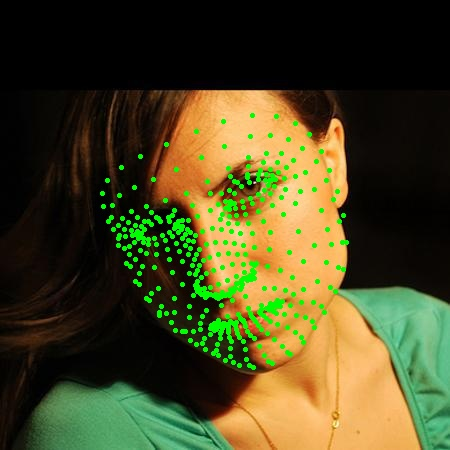

In [37]:
# Choosing a random image
random_file = 'image00444'

# Load the FaceMesh module from MediaPipe
faceModule = mp.solutions.face_mesh

# Loading image and its corresponding mat file
with faceModule.FaceMesh(static_image_mode=True) as faces:
    # Loading the image
    image = cv2.imread('E:\\iti ai intake 44 (2023-2024)\\ml2\\AFLW2000\\' + random_file + '.jpg')

    # Processing the face to extract the landmark points (468 points) for each x, y, z
    results = faces.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    xl=[]
    yl=[]    
    if results.multi_face_landmarks is not None:
        # Looping over the faces in the image
        for face in results.multi_face_landmarks:
            for landmark in face.landmark:
                x = landmark.x
                y = landmark.y
                # Note: the x and y values are scaled to their width and height,
                # so we will get back their actual value in the image
                shape = image.shape 
                relative_x = int(x * shape[1])
                relative_y = int(y * shape[0])
                # cv2.putText(image, str(relative_y), (int(relative_x), int(relative_y)), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 0), 2)
                cv2.circle(image, (relative_x, relative_y), radius=1, color=(0, 255, 0), thickness=2)
                xl.append(relative_x)
                yl.append(relative_y)

        # Save the image to a temporary file
        temp_image_path = 'temp_image.jpg'
        cv2.imwrite(temp_image_path, image)

        # Display the image in the notebook
        display(Image(filename=temp_image_path))



<span style="font-size:24px;">**Facial Pose Estimation with Axis Visualization**</span>

This code snippet demonstrates how to estimate the facial pose (pitch, yaw, and roll angles) from an image using the extracted landmarks and visualize the estimated pose axes on the image.
It first loads an image and its corresponding mat file containing the ground truth pose parameters. Then, it uses the extracted landmark points and pose parameters to draw 3D axes representing the estimated pose on the facial image. Finally, it displays the image with the axes drawn using matplotlib.
The pose axes indicate the direction in which the person is looking in terms of pitch, yaw, and roll angles.
This visualization aids in understanding the orientation of the face in the image.

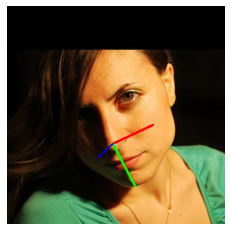

In [38]:
import matplotlib.pyplot as plt
# Function to draw 3D axes on the image based on the estimated pose angles

def draw_axis(img, pitch, yaw, roll, tdx=None, tdy=None, size=100):
    yaw = -yaw
    if tdx is not None and tdy is not None:
        tdx = tdx
        tdy = tdy
    else:
        height, width = img.shape[:2]
        tdx = width / 2.0
        tdy = height / 2.0

    x1 = size * (np.cos(yaw) * np.cos(roll)) + tdx
    y1 = size * (np.cos(pitch) * np.sin(roll) + np.cos(roll) * np.sin(pitch) * np.sin(yaw)) + tdy

    x2 = size * (-np.cos(yaw) * np.sin(roll)) + tdx
    y2 = size * (np.cos(pitch) * np.cos(roll) - np.sin(pitch) * np.sin(yaw) * np.sin(roll)) + tdy

    x3 = size * (np.sin(yaw)) + tdx
    y3 = size * (-np.cos(yaw) * np.sin(pitch)) + tdy

    # Create a copy of the image to draw on
    img_with_axis = img

    cv2.line(img_with_axis, (int(tdx), int(tdy)), (int(x1), int(y1)), (0, 0, 255), 3)
    cv2.line(img_with_axis, (int(tdx), int(tdy)), (int(x2), int(y2)), (0, 255, 0), 3)
    cv2.line(img_with_axis, (int(tdx), int(tdy)), (int(x3), int(y3)), (255, 0, 0), 2)

    return img_with_axis
 # Choosing a random image
random_file = 'image00444'

# Load the image and corresponding mat file
image = cv2.imread('E:\\iti ai intake 44 (2023-2024)\\ml2\\AFLW2000\\' + random_file + '.jpg')
mat_file = sio.loadmat('E:\iti ai intake 44 (2023-2024)\ml2\AFLW2000/'+random_file+'.mat')

# Extracting the ground truth labels for pitch, yaw, and roll angles
pose_para = mat_file["Pose_Para"][0][:3]
pitch = pose_para[0]
yaw = pose_para[1]
roll = pose_para[2]

# Draw 3D axis on the image based on the estimated pose angles
image_with_axis = draw_axis(image, pitch, yaw, roll, xl[4], yl[4], size=100)

# Display the image with the drawn axes using matplotlib
plt.imshow(cv2.cvtColor(image_with_axis, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


-------------------------------------------------------------------

<span style="font-size:24px;">**XGBoost Regression for Facial Pose Estimation**</span>

This code snippet demonstrates how to train XGBoost regression models to estimate facial pose 
(yaw, pitch, and roll angles) using landmark features. It first splits the data into train, 
validation, and test sets. Then, it trains XGBoost regression models separately for each axis 
(yaw, pitch, and roll) using the training data. After training, it evaluates the models on 
the validation set and calculates metrics such as R-squared, mean absolute error (MAE), 
and mean squared error (MSE). Finally, it evaluates the models on the test set and prints 
the evaluation results for each axis. This process helps in assessing the performance of 
the XGBoost models in estimating facial pose angles.

In [46]:
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Split data into train, validation, and test sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.3, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.5, random_state=42) 

# Train XGBoost models for each axis
models = {}
model_evaluations = {}

# Train models
for axis in ['Yaw', 'Pitch', 'Roll']:
    xgb_model = XGBRegressor()  # You can specify hyperparameters here
    xgb_model.fit(X_train, y_train[axis])
    models[axis] = xgb_model

# Evaluate models on the validation set
for axis, model in models.items():
    y_val_pred = model.predict(X_val)
    r2_val = model.score(X_val, y_val[axis])  # Calculate R-squared using the score method
    mae_val = mean_absolute_error(y_val[axis], y_val_pred)
    mse_val = mean_squared_error(y_val[axis], y_val_pred)
    model_evaluations[axis] = {
        'R-squared (Validation)': r2_val,
        'MAE (Validation)': mae_val,
        'MSE (Validation)': mse_val
    }

# Evaluate models on the test set
for axis, model in models.items():
    y_test_pred = model.predict(X_test)
    r2_test = model.score(X_test, y_test[axis])  # Calculate R-squared using the score method
    mae_test = mean_absolute_error(y_test[axis], y_test_pred)
    mse_test = mean_squared_error(y_test[axis], y_test_pred)
    model_evaluations[axis]['R-squared (Test)'] = r2_test
    model_evaluations[axis]['MAE (Test)'] = mae_test
    model_evaluations[axis]['MSE (Test)'] = mse_test

# Print model evaluations
for axis, evaluation in model_evaluations.items():
    print(f"{axis} Model Evaluation:")
    for metric, value in evaluation.items():
        print(f"{metric}: {value:.4f}")
    print()


Yaw Model Evaluation:
R-squared (Validation): 0.8576
MAE (Validation): 0.0827
MSE (Validation): 0.0379
R-squared (Test): 0.5738
MAE (Test): 0.1204
MSE (Test): 0.1243

Pitch Model Evaluation:
R-squared (Validation): -3.3666
MAE (Validation): 0.1357
MSE (Validation): 0.3284
R-squared (Test): -3.4757
MAE (Test): 0.1581
MSE (Test): 0.4987

Roll Model Evaluation:
R-squared (Validation): 0.5646
MAE (Validation): 0.0663
MSE (Validation): 0.0538
R-squared (Test): -8.2267
MAE (Test): 0.1966
MSE (Test): 1.4877



------------------------------------------------------------------

<span style="font-size:24px;">**Support Vector Regression (SVR) for Facial Pose Estimation**</span>

This code snippet demonstrates how to train Support Vector Regression (SVR) models to estimate facial pose 
(yaw, pitch, and roll angles) using landmark features. It first splits the data into train, validation, 
and test sets. Then, it trains SVR models separately for each axis (yaw, pitch, and roll) using the training data. 
After training, it evaluates the models on the validation set and calculates metrics such as R-squared, 
mean absolute error (MAE), and mean squared error (MSE). Finally, it evaluates the models on the test set 
and prints the evaluation results for each axis. SVR is chosen as the model for its capability to handle 
non-linear relationships between features and labels, which can be beneficial for capturing the complex 
relationships between facial landmarks and pose angles.

In [48]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Split data into train, validation, and test sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.3, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.5, random_state=42)  

# Train SVR models for each axis
models = {}
model_evaluations = {}

# Train models
for axis in ['Yaw', 'Pitch', 'Roll']:
    svr_model = SVR()  # You can specify hyperparameters here
    svr_model.fit(X_train, y_train[axis])
    models[axis] = svr_model

# Evaluate models on the validation set
for axis, model in models.items():
    y_val_pred = model.predict(X_val)
    r2_val = r2_score(y_val[axis], y_val_pred)
    mae_val = mean_absolute_error(y_val[axis], y_val_pred)
    mse_val = mean_squared_error(y_val[axis], y_val_pred)
    model_evaluations[axis] = {
        'R-squared (Validation)': r2_val,
        'MAE (Validation)': mae_val,
        'MSE (Validation)': mse_val
    }

# Evaluate models on the test set
for axis, model in models.items():
    y_test_pred = model.predict(X_test)
    r2_test = r2_score(y_test[axis], y_test_pred)
    mae_test = mean_absolute_error(y_test[axis], y_test_pred)
    mse_test = mean_squared_error(y_test[axis], y_test_pred)
    model_evaluations[axis]['R-squared (Test)'] = r2_test
    model_evaluations[axis]['MAE (Test)'] = mae_test
    model_evaluations[axis]['MSE (Test)'] = mse_test

# Print model evaluations
for axis, evaluation in model_evaluations.items():
    print(f"{axis} Model Evaluation:")
    for metric, value in evaluation.items():
        print(f"{metric}: {value:.4f}")
    print()


Yaw Model Evaluation:
R-squared (Validation): 0.9230
MAE (Validation): 0.0635
MSE (Validation): 0.0205
R-squared (Test): 0.9117
MAE (Test): 0.0783
MSE (Test): 0.0258

Pitch Model Evaluation:
R-squared (Validation): 0.6492
MAE (Validation): 0.0799
MSE (Validation): 0.0264
R-squared (Test): 0.6604
MAE (Test): 0.0983
MSE (Test): 0.0378

Roll Model Evaluation:
R-squared (Validation): 0.5778
MAE (Validation): 0.0606
MSE (Validation): 0.0522
R-squared (Test): 0.7492
MAE (Test): 0.0831
MSE (Test): 0.0404



<span style="font-size:24px;">**Facial Landmark Extraction Of New Data**</span>

In [13]:
def extract_landmarks(image_path):
    # Initialize MediaPipe FaceMesh
    face_mesh = mp.solutions.face_mesh.FaceMesh(static_image_mode=True, max_num_faces=1)

    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not read image {image_path}")
        return None, None, None
    
    # Convert image to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Process the image to find facial landmarks
    result = face_mesh.process(image_rgb)
    
    if result.multi_face_landmarks:
        landmark_points = []
        # Loop through each detected face
        for facial_landmarks in result.multi_face_landmarks:
            # Loop through each landmark point
            for landmark in facial_landmarks.landmark:
                x = landmark.x * image.shape[1]  # Convert normalized x-coordinate to pixel coordinate
                y = landmark.y * image.shape[0]  # Convert normalized y-coordinate to pixel coordinate
                landmark_points.extend([x, y])
        
        # Find the index of the nose point (assuming it's the first point)
        nose_index = 4
        nose_x, nose_y = landmark_points[nose_index * 2], landmark_points[nose_index * 2 + 1]
        
        # Calculate the Euclidean distance from the nose to the chin
        chin_index = 152  # Assuming the chin point is the last point
        chin_x, chin_y = landmark_points[chin_index * 2], landmark_points[chin_index * 2 + 1]
        euclidean_distance = np.sqrt((chin_x - nose_x)**2 + (chin_y - nose_y)**2)
        
        # Normalize landmark points
        for i in range(len(landmark_points) // 2):
            landmark_points[i * 2] = (landmark_points[i * 2] - nose_x) / euclidean_distance
            landmark_points[i * 2 + 1] = (landmark_points[i * 2 + 1] - nose_y) / euclidean_distance
        
        # Create a DataFrame from the collected landmark data
        columns = ['Image']
        for i in range(1, 469):
            columns.extend([f"X{i}", f"Y{i}"])
        landmark_df = pd.DataFrame([[image_path] + landmark_points], columns=columns)
        landmark_df.drop(['Image'],axis=1,inplace=True)
        return landmark_df, nose_x, nose_y
    else:
        print(f"No face detected in the image {image_path}")
        return None, None, None

def process_images(image_paths):
    all_landmark_dfs = []
    all_nose_coordinates = []
    for image_path in image_paths:
        landmark_df, nose_x, nose_y = extract_landmarks(image_path)
        if landmark_df is not None:
            all_landmark_dfs.append(landmark_df)
            all_nose_coordinates.append((nose_x, nose_y))
    return all_landmark_dfs, all_nose_coordinates

# Example usage:
image_paths = ['face.jpg', '2.jpeg', '3.jpg', '4.jpg', '5.jpg', '6.webp']
landmark_dfs, nose_coordinates = process_images(image_paths)


In [14]:
landmark_dfs

[         X1        Y1        X2        Y2        X3       Y3        X4  \
 0 -0.045342  0.349397 -0.043537  0.077502  0.034101  0.20812  0.157558   
 
          Y4   X5   Y5  ...      X464     Y464      X465      Y465      X466  \
 0 -0.161165  0.0  0.0  ...  0.713803 -0.06805  0.648916 -0.088511  0.592423   
 
        Y466      X467      Y467     X468      Y468  
 0 -0.103931  1.145282  0.199501  1.21988  0.211871  
 
 [1 rows x 936 columns],
          X1        Y1        X2        Y2        X3        Y3        X4  \
 0 -0.187735  0.343041 -0.026869  0.079478 -0.170913  0.130834 -0.118897   
 
          Y4   X5   Y5  ...      X464     Y464      X465      Y465      X466  \
 0 -0.223185  0.0  0.0  ... -0.090155 -0.52861 -0.101218 -0.499425 -0.088686   
 
        Y466      X467      Y467      X468      Y468  
 0 -0.471849  0.171292 -0.568132  0.204477 -0.619831  
 
 [1 rows x 936 columns],
          X1        Y1       X2        Y2        X3        Y3        X4  \
 0  0.151604  0.276831 

<span style="font-size:24px;">**Facial Landmark-Based Axis Prediction and Visualization**</span>


This code defines a function to predict the orientation axis (yaw, pitch, and roll) of a face 
in images using machine learning models trained on facial landmark data. The function takes 
a list of image paths, pre-trained models for each axis, corresponding landmark DataFrames, 
and nose coordinates as input. For each image, it extracts the facial landmarks, predicts 
the orientation axes using the provided models, and visualizes the predicted orientation 
axis on the image. The visualization includes drawing a 3D axis on the face based on the 
predicted yaw, pitch, and roll angles. This code enables the prediction and visualization 
of facial orientation axes, which can be useful for tasks such as head pose estimation 
and augmented reality applications.

Yaw Predictions: [0.59502446]
Pitch Predictions: [0.25882012]
Roll Predictions: [0.77504637]


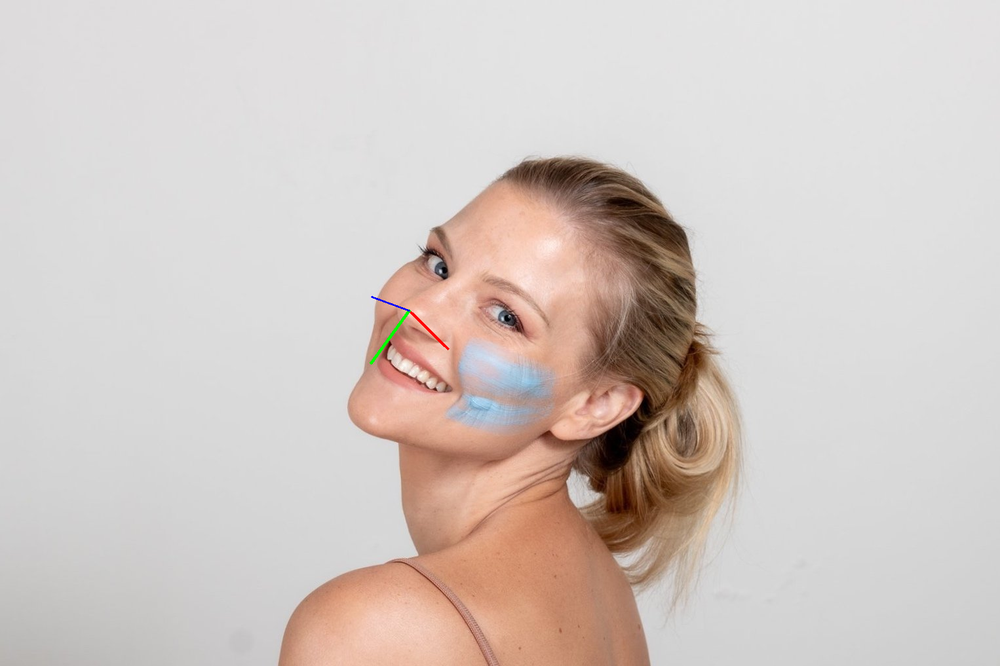

Yaw Predictions: [-0.66157796]
Pitch Predictions: [-0.41587477]
Roll Predictions: [0.34572435]


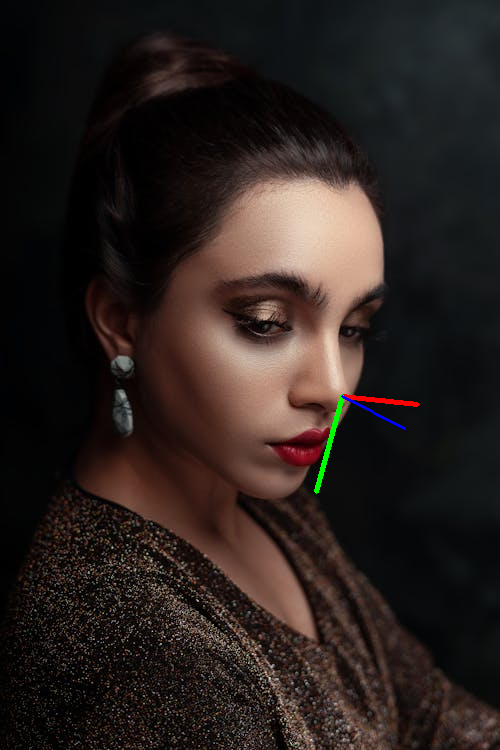

Yaw Predictions: [0.14682377]
Pitch Predictions: [-0.12039914]
Roll Predictions: [-0.29305379]


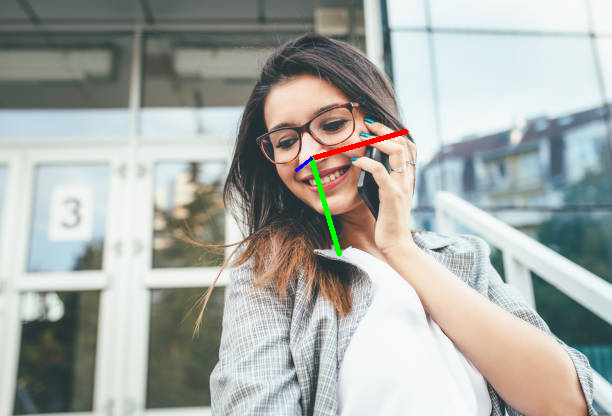

Yaw Predictions: [0.64428973]
Pitch Predictions: [-0.45030138]
Roll Predictions: [-0.53605709]


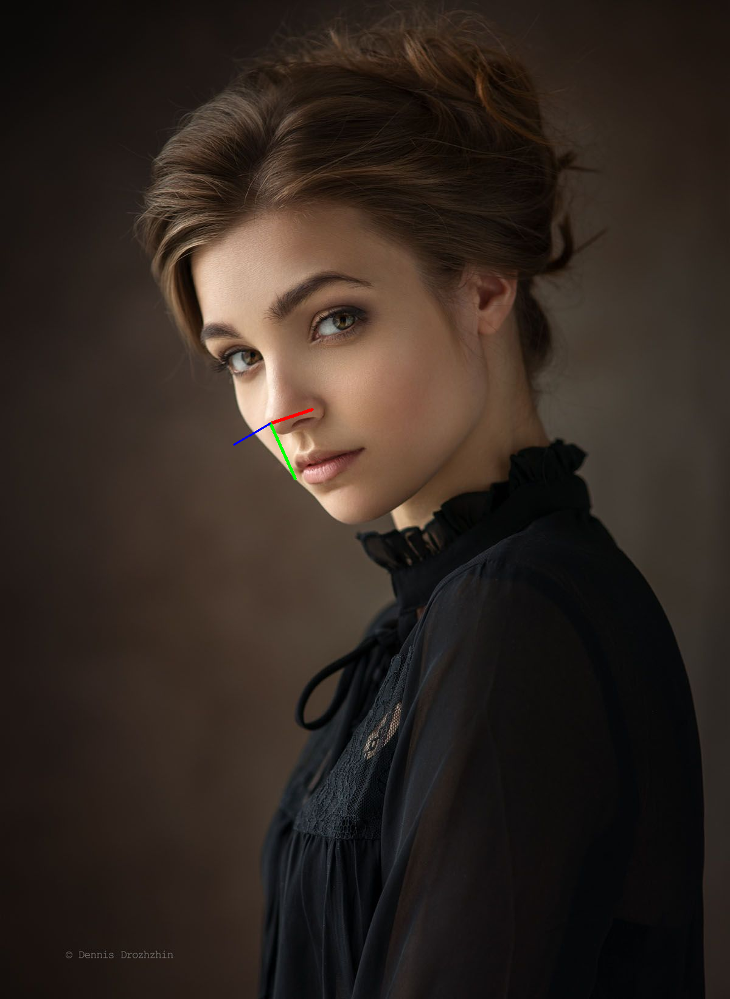

Yaw Predictions: [-0.52292839]
Pitch Predictions: [-0.24453591]
Roll Predictions: [0.16845218]


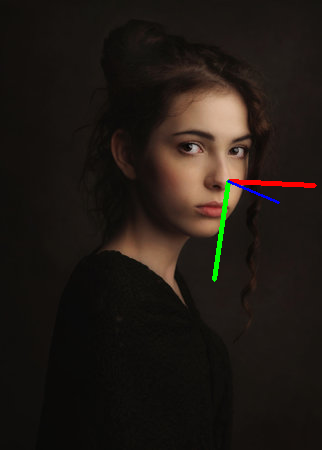

Yaw Predictions: [-0.28164768]
Pitch Predictions: [-0.1646844]
Roll Predictions: [0.21036934]


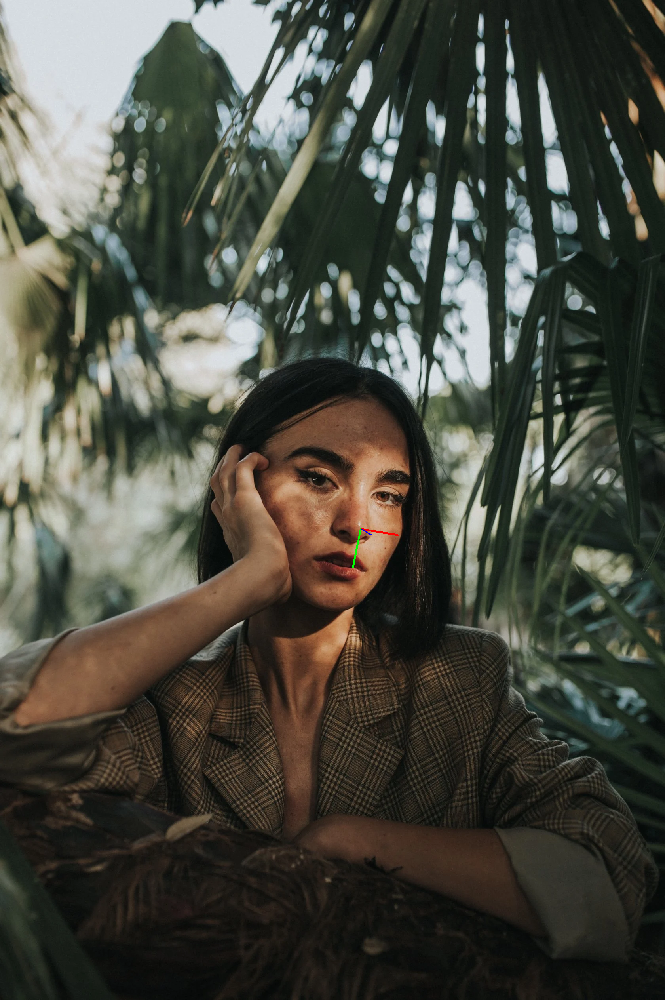

In [50]:
def predict_and_draw_axis_on_images(image_paths, models, landmark_dfs, nose_coordinates):
    for i, image_path in enumerate(image_paths):
        img = cv2.imread(image_path)
        if img is None:
            print(f"Error: Could not read image {image_path}")
            continue

        # Extract features for the specific image
        landmark_df = landmark_dfs[i]

        # Predictions for each axis
        yaw_predictions = models['Yaw'].predict(landmark_df)
        pitch_predictions = models['Pitch'].predict(landmark_df)
        roll_predictions = models['Roll'].predict(landmark_df)
        print("Yaw Predictions:", yaw_predictions)
        print("Pitch Predictions:", pitch_predictions)
        print("Roll Predictions:", roll_predictions)
        # Assuming the nose coordinates are in the list of nose coordinates
        nose_x, nose_y = nose_coordinates[i]

        # Draw axis on the image
        result_image = draw_axis(img, pitch_predictions, yaw_predictions, roll_predictions, nose_x, nose_y)

        # Display the result image
        display_image(result_image)

# Function to display an image in the notebook
def display_image(image):
    from IPython.display import display, Image
    _, img_png = cv2.imencode('.png', image)
    display(Image(data=img_png))

# Example usage:
image_paths = ['face.jpg', '2.jpeg', '3.jpg', '4.jpg', '5.jpg', '6.webp']
predict_and_draw_axis_on_images(image_paths, models, landmark_dfs, nose_coordinates)


------------------------------------------------------------

<span style="font-size:24px;">**Real-Time Facial Landmark-Based Axis Prediction and Visualization in Video**</span>



This code utilizes the MediaPipe FaceMesh model to detect facial landmarks in real-time video streams. 
It then predicts the orientation axis (yaw, pitch, and roll) of each detected face using pre-trained 
machine learning models. The facial landmark points are normalized based on the distance between the 
nose and chin, and the normalized points are fed into the models for predictions. The predicted axis 
orientations are visualized by drawing a 3D axis on each detected face in the video frames. Finally, 
the modified frames with the visualized axes are saved as a new video file. This code enables the 
real-time prediction and visualization of facial orientation axes in videos, which can be useful 
for various applications such as facial analysis, augmented reality, and human-computer interaction.

In [ ]:
# Initialize MediaPipe FaceMesh
face_mesh = mp.solutions.face_mesh.FaceMesh(static_image_mode=False, max_num_faces=1)

# Video path for the specific video want to process
video_path = r"C:\Users\Dell\Downloads/lucy.mp4"  # the input video
output_video_path = r"C:\Users\Dell\Downloads/lucy2.mp4"  # the output video 

# Open the video file
video_capture = cv2.VideoCapture(video_path)

# Get the video's FPS, width, and height
fps = int(video_capture.get(cv2.CAP_PROP_FPS))
width = int(video_capture.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video_capture.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Create VideoWriter object to save the processed video
fourcc = cv2.VideoWriter_fourcc(*'avc1')
out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

# Initialize an empty list to store the modified frames
modified_frames = []

# Loop through each frame in the video
while video_capture.isOpened():
    # Read a frame from the video
    ret, frame = video_capture.read()
    if not ret:
        break
    
    # Convert frame to RGB
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # Process the frame to find facial landmarks
    result = face_mesh.process(frame_rgb)
    
    if result.multi_face_landmarks:
        landmark_points = []
        # Loop through each detected face
        for facial_landmarks in result.multi_face_landmarks:
            nose_x = facial_landmarks.landmark[4].x * width
            nose_y = facial_landmarks.landmark[4].y * height
            chin_x = facial_landmarks.landmark[152].x * width
            chin_y = facial_landmarks.landmark[152].y * height
        
            # Calculate the distance from the chin to the nose
            distance = np.sqrt((chin_x - nose_x) ** 2 + (chin_y - nose_y) ** 2)
            
            # Normalize landmark points using the distance
            for landmark in facial_landmarks.landmark:
                x = (landmark.x * width - nose_x) / distance
                y = (landmark.y * height - nose_y) / distance
                landmark_points.extend([x, y])
                
        # Make predictions for the normalized landmark points (replace this with your model predictions)
        o=[]
        new_data =np.array(landmark_points).reshape(1,-1)  # Load or prepare new data
        for axis, model in models.items():
            new_data_pred = model.predict(new_data)
            print(f"Predictions for {axis}: {new_data_pred}")
            o.append(new_data_pred)
        # Draw the axis on the frame
        #frame = draw_axis(frame, pitch=o[1], yaw=o[0], roll=o[2], nose_x, nose_y)
        frame = draw_axis(frame, o[1], o[0], o[2], nose_x, nose_y)

        # Write the modified frame to the output video
        out.write(frame)

        # Append the modified frame to the list
        modified_frames.append(frame)

# Release VideoCapture and VideoWriter objects
video_capture.release()
out.release()

# Convert the list of modified frames to a numpy array
modified_frames = np.array(modified_frames)

# Display the final video
from IPython.display import Video

# Display the final video (show only the first 10 frames)
for frame in modified_frames[:10]:
    display(Image(data=cv2.imencode('.png', frame)[1]))

